In [63]:
import torch
print(torch.__version__)
print(torch.cuda.is_available())
print(torch.cuda.get_device_name())

2.8.0.dev20250423+cu128
True
NVIDIA GeForce RTX 3070


# Классификация Oxford Pets

Обучим сеть для классификации исходного датасета [Oxford-IIIT Dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/). Загрузите датасет с Kaggle.

In [1]:
import kagglehub

path = kagglehub.dataset_download("tanlikesmath/the-oxfordiiit-pet-dataset")

print("Path to dataset files:", path)

h:\ML\ML_clean\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Path to dataset files: C:\Users\Maxim\.cache\kagglehub\datasets\tanlikesmath\the-oxfordiiit-pet-dataset\versions\1


## Соберём все названия пород, а также отрисуем:

In [1]:
dataset_path = 'datasets/oxford'

In [2]:
import os
def get_base_name(filename):
    name_part, _ = os.path.splitext(filename)

    parts = name_part.split('_')

    base_parts = []
    for part in parts:
        if part.isdigit():
            break
        base_parts.append(part)

    base_name = '_'.join(base_parts)

    return base_name

In [3]:
from matplotlib.image import imread
import matplotlib.pyplot as plt

In [6]:
from PIL import Image
import math

def display_images(l,titles=None):
    n=len(l)
    dim = math.ceil(n**0.5)
    fig,ax = plt.subplots(dim,dim)
    for i,im in enumerate(l):
        ax[i//dim][i%dim].imshow(im.resize((224,224)))
        ax[i//dim][i%dim].axis('off')
        if titles is not None:
            ax[i//dim][i%dim].set_title(titles[i], fontsize = 200)
    fig.set_size_inches(fig.get_size_inches()*n)
    plt.tight_layout()
    plt.show()

def get_unique_files(folder_path):
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith('.jpg')]

    unique_names = dict()

    for filename in image_files:
        base_name = get_base_name(filename)

        if base_name not in unique_names.keys():
            unique_names[base_name] = Image.fromarray(imread(os.path.join(folder_path, filename)))

    return unique_names

names_images = get_unique_files(dataset_path)

display_images(list(names_images.values()), list(names_images.keys()))

In [8]:
all_categories = list(names_images.keys())
print(all_categories)

['american_pit_bull_terrier', 'leonberger', 'english_cocker_spaniel', 'Siamese', 'boxer', 'saint_bernard', 'american_bulldog', 'Sphynx', 'Egyptian_Mau', 'Birman', 'english_setter', 'newfoundland', 'pug', 'yorkshire_terrier', 'Abyssinian', 'havanese', 'miniature_pinscher', 'chihuahua', 'basset_hound', 'scottish_terrier', 'Bombay', 'British_Shorthair', 'Maine_Coon', 'Bengal', 'staffordshire_bull_terrier', 'japanese_chin', 'shiba_inu', 'wheaten_terrier', 'beagle', 'Persian', 'great_pyrenees', 'pomeranian', 'samoyed', 'german_shorthaired', 'Ragdoll', 'keeshond', 'Russian_Blue']


### Отобрав ручками котов, получаем:

In [9]:
cats_list = ['Abyssinian', 'Bengal', 'Birman', 'Bombay', 'British_Shorthair', 'Egyptian_Mau', 'Maine_Coon', 'Persian', 'Ragdoll', 'Russian_Blue','Siamese', 'Sphynx']

In [10]:
dogs_list = [val for val in all_categories if val not in cats_list]
print(dogs_list)

['american_pit_bull_terrier', 'leonberger', 'english_cocker_spaniel', 'boxer', 'saint_bernard', 'american_bulldog', 'english_setter', 'newfoundland', 'pug', 'yorkshire_terrier', 'havanese', 'miniature_pinscher', 'chihuahua', 'basset_hound', 'scottish_terrier', 'staffordshire_bull_terrier', 'japanese_chin', 'shiba_inu', 'wheaten_terrier', 'beagle', 'great_pyrenees', 'pomeranian', 'samoyed', 'german_shorthaired', 'keeshond']


In [11]:
print(len(all_categories),'=', len(cats_list), '+', len(dogs_list))

37 = 12 + 25


## Рассортируем классы:

In [12]:
NUM_CATEGORIES = len(all_categories)
CLASS_EDGE = len(cats_list)
print(NUM_CATEGORIES, CLASS_EDGE)

37 12


In [13]:
import numpy as np

def load_dataset(folder_path):
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith('.jpg')]

    image_paths, labels = [], []
    counter = 0
    for filename in image_files:
        base_name = get_base_name(filename)

        index = -1
        try:
            index = cats_list.index(base_name)
        except ValueError:
            index = CLASS_EDGE + dogs_list.index(base_name)
        #print(filename)
        #print(index)
        #counter+=1
        #if counter == 10: break
        labels.append(index)
        image_paths.append(os.path.join(folder_path, filename))
        #image_read = imread(os.path.join(folder_path, filename))
        #image_changed = Image.fromarray((image_read * 1).astype(np.uint8)).convert('RGB')
        #image_changed = np.array(image_changed)/255
        #images.append(image_read)

    return image_paths, labels

images, labels = load_dataset(dataset_path)

28
japanese_chin


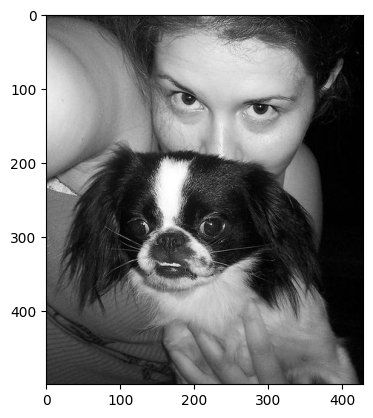

In [15]:
print_ind = 1660
print_label = labels[print_ind]
print(print_label)
if print_ind < CLASS_EDGE:
    print(cats_list[print_label])
else:
    print(dogs_list[print_label-CLASS_EDGE])
plt.imshow(imread(images[print_ind]))
plt.show()

In [16]:
print(len([f for f in os.listdir(dataset_path) if f.lower().endswith('.jpg')]), '=', len(images), '=', len(labels))

7389 = 7389 = 7389


## Побьём датасеты

In [17]:
from sklearn.model_selection import train_test_split

labels = np.array(labels)

train_images, test_images, train_labels, test_labels = train_test_split(
    images,
    labels,
    test_size=0.1,
    random_state=42,
    stratify=labels
)

train_images, val_images, train_labels, val_labels = train_test_split(
    train_images,
    train_labels,
    test_size=0.11,
    random_state=42,
    stratify=train_labels
)

### Подготовим модели и загрузку

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader
import numpy as np
from PIL import Image
import copy

class CustomDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

image_transformation = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

image_datasets = {
    'train': CustomDataset(train_images, train_labels, image_transformation),
    'val': CustomDataset(val_images, val_labels, image_transformation),
    'test': CustomDataset(test_images, test_labels, image_transformation)
}

BATCH_SIZE = 32

dataloaders = {
    'train': DataLoader(image_datasets['train'], batch_size=BATCH_SIZE, shuffle=True),
    'val': DataLoader(image_datasets['val'], batch_size=BATCH_SIZE, shuffle=False),
    'test': DataLoader(image_datasets['test'], batch_size=BATCH_SIZE, shuffle=False)
}

dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val', 'test']}
device = torch.device("cuda")

In [32]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    print(f'Best val Acc: {best_acc:4f}')

    model.load_state_dict(best_model_wts)
    return model

## Берём предобученную модель VGG-16, замораживаем веса и смотрим

In [20]:
!pip install torchinfo

In [28]:
import torchinfo

def vgg16_model(num_classes):
    model = models.vgg16(pretrained=True)

    for param in model.parameters():
        param.requires_grad = False

    num_features = model.classifier[6].in_features
    model.classifier[6] = nn.Linear(num_features, num_classes)

    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.classifier[6].parameters(), lr=0.001, momentum=0.9)

    exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    return model, criterion, optimizer, exp_lr_scheduler

vgg16, criterion, optimizer, scheduler = vgg16_model(NUM_CATEGORIES)

In [29]:
torchinfo.summary(vgg16,
        input_size=(32, 3, 224, 224),
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
VGG (VGG)                                [32, 3, 224, 224]    [32, 37]             --                   Partial
├─Sequential (features)                  [32, 3, 224, 224]    [32, 512, 7, 7]      --                   False
│    └─Conv2d (0)                        [32, 3, 224, 224]    [32, 64, 224, 224]   (1,792)              False
│    └─ReLU (1)                          [32, 64, 224, 224]   [32, 64, 224, 224]   --                   --
│    └─Conv2d (2)                        [32, 64, 224, 224]   [32, 64, 224, 224]   (36,928)             False
│    └─ReLU (3)                          [32, 64, 224, 224]   [32, 64, 224, 224]   --                   --
│    └─MaxPool2d (4)                     [32, 64, 224, 224]   [32, 64, 112, 112]   --                   --
│    └─Conv2d (5)                        [32, 64, 112, 112]   [32, 128, 112, 112]  (73,856)             False
│    └─ReLU (

## Обучаем модель

In [35]:
vgg16 = train_model(vgg16, criterion, optimizer, scheduler, num_epochs=10)

Epoch 0/9
----------
train Loss: 0.9926 Acc: 0.7469
val Loss: 0.4035 Acc: 0.9057

Epoch 1/9
----------
train Loss: 0.4111 Acc: 0.8792
val Loss: 0.3237 Acc: 0.9194

Epoch 2/9
----------
train Loss: 0.3369 Acc: 0.9013
val Loss: 0.3055 Acc: 0.9112

Epoch 3/9
----------
train Loss: 0.3050 Acc: 0.9052
val Loss: 0.2881 Acc: 0.9167

Epoch 4/9
----------
train Loss: 0.2766 Acc: 0.9142
val Loss: 0.2868 Acc: 0.9208

Epoch 5/9
----------
train Loss: 0.2597 Acc: 0.9160
val Loss: 0.2771 Acc: 0.9194

Epoch 6/9
----------
train Loss: 0.2462 Acc: 0.9250
val Loss: 0.2709 Acc: 0.9180

Epoch 7/9
----------
train Loss: 0.2187 Acc: 0.9329
val Loss: 0.2680 Acc: 0.9194

Epoch 8/9
----------
train Loss: 0.2243 Acc: 0.9326
val Loss: 0.2659 Acc: 0.9194

Epoch 9/9
----------
train Loss: 0.2238 Acc: 0.9285
val Loss: 0.2658 Acc: 0.9194

Best val Acc: 0.920765


## Долговато... Будем выполнять обучение для 5 эпох в дальнейшем

In [36]:
def vgg19_model(num_classes):
    model = models.vgg19(pretrained=True)

    for param in model.parameters():
        param.requires_grad = False

    num_features = model.classifier[6].in_features
    model.classifier[6] = nn.Linear(num_features, num_classes)

    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.classifier[6].parameters(), lr=0.001, momentum=0.9)

    exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    return model, criterion, optimizer, exp_lr_scheduler

vgg19, criterion, optimizer, scheduler = vgg19_model(NUM_CATEGORIES)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:07<00:00, 78.8MB/s]


In [37]:
torchinfo.summary(vgg19,
        input_size=(32, 3, 224, 224),
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
VGG (VGG)                                [32, 3, 224, 224]    [32, 37]             --                   Partial
├─Sequential (features)                  [32, 3, 224, 224]    [32, 512, 7, 7]      --                   False
│    └─Conv2d (0)                        [32, 3, 224, 224]    [32, 64, 224, 224]   (1,792)              False
│    └─ReLU (1)                          [32, 64, 224, 224]   [32, 64, 224, 224]   --                   --
│    └─Conv2d (2)                        [32, 64, 224, 224]   [32, 64, 224, 224]   (36,928)             False
│    └─ReLU (3)                          [32, 64, 224, 224]   [32, 64, 224, 224]   --                   --
│    └─MaxPool2d (4)                     [32, 64, 224, 224]   [32, 64, 112, 112]   --                   --
│    └─Conv2d (5)                        [32, 64, 112, 112]   [32, 128, 112, 112]  (73,856)             False
│    └─ReLU (

In [38]:
vgg19 = train_model(vgg19, criterion, optimizer, scheduler, num_epochs=5)

Epoch 0/4
----------
train Loss: 0.9861 Acc: 0.7509
val Loss: 0.4086 Acc: 0.9044

Epoch 1/4
----------
train Loss: 0.3968 Acc: 0.8861
val Loss: 0.3294 Acc: 0.9030

Epoch 2/4
----------
train Loss: 0.3430 Acc: 0.8949
val Loss: 0.3082 Acc: 0.9085

Epoch 3/4
----------
train Loss: 0.3090 Acc: 0.9045
val Loss: 0.2883 Acc: 0.9112

Epoch 4/4
----------
train Loss: 0.2826 Acc: 0.9155
val Loss: 0.2820 Acc: 0.9139

Best val Acc: 0.913934


In [39]:
def resnet_model(num_classes):
    model = models.resnet50(pretrained=True)

    for param in model.parameters():
        param.requires_grad = False

    num_features = model.fc.in_features
    model.fc = nn.Linear(num_features, num_classes)

    model = model.to(device)

    criterion = nn.CrossEntropyLoss()

    optimizer = optim.SGD(model.fc.parameters(), lr=0.001, momentum=0.9)

    exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    return model, criterion, optimizer, exp_lr_scheduler

resnet, criterion, optimizer, scheduler = resnet_model(NUM_CATEGORIES)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 196MB/s]


In [40]:
torchinfo.summary(resnet,
        input_size=(32, 3, 224, 224),
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet (ResNet)                          [32, 3, 224, 224]    [32, 37]             --                   Partial
├─Conv2d (conv1)                         [32, 3, 224, 224]    [32, 64, 112, 112]   (9,408)              False
├─BatchNorm2d (bn1)                      [32, 64, 112, 112]   [32, 64, 112, 112]   (128)                False
├─ReLU (relu)                            [32, 64, 112, 112]   [32, 64, 112, 112]   --                   --
├─MaxPool2d (maxpool)                    [32, 64, 112, 112]   [32, 64, 56, 56]     --                   --
├─Sequential (layer1)                    [32, 64, 56, 56]     [32, 256, 56, 56]    --                   False
│    └─Bottleneck (0)                    [32, 64, 56, 56]     [32, 256, 56, 56]    --                   False
│    │    └─Conv2d (conv1)               [32, 64, 56, 56]     [32, 64, 56, 56]     (4,096)              False
│    │    

In [41]:
resnet = train_model(resnet, criterion, optimizer, scheduler, num_epochs=5)

Epoch 0/4
----------
train Loss: 2.2695 Acc: 0.6075
val Loss: 1.1544 Acc: 0.8962

Epoch 1/4
----------
train Loss: 0.9484 Acc: 0.8824
val Loss: 0.6575 Acc: 0.9003

Epoch 2/4
----------
train Loss: 0.6509 Acc: 0.8962
val Loss: 0.5195 Acc: 0.9098

Epoch 3/4
----------
train Loss: 0.5238 Acc: 0.9067
val Loss: 0.4345 Acc: 0.9208

Epoch 4/4
----------
train Loss: 0.4531 Acc: 0.9115
val Loss: 0.3899 Acc: 0.9235

Best val Acc: 0.923497


In [42]:
def evaluate_model(model, phase='test'):
    model.eval()

    running_corrects = 0

    for inputs, labels in dataloaders[phase]:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        running_corrects += torch.sum(preds == labels.data)

    acc = running_corrects.double() / dataset_sizes[phase]
    print(f'Test Accuracy: {acc:.4f}')

print("Evaluating VGG-16:")
evaluate_model(vgg16)

print("\nEvaluating VGG-19:")
evaluate_model(vgg19)

print("\nEvaluating ResNet:")
evaluate_model(resnet)

Evaluating VGG-16:
Test Accuracy: 0.9066

Evaluating VGG-19:
Test Accuracy: 0.9093

Evaluating ResNet:
Test Accuracy: 0.8958


In [53]:
torch.save(vgg19.state_dict(), 'vgg19_weights.pth')

## Выбираем VGG-19! ResNet - более сложная модель, возможно на большем числе эпох она бы вырвалась вперёд, но имеем что имеем

In [45]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

def plot_confusion_matrix(model, loader):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

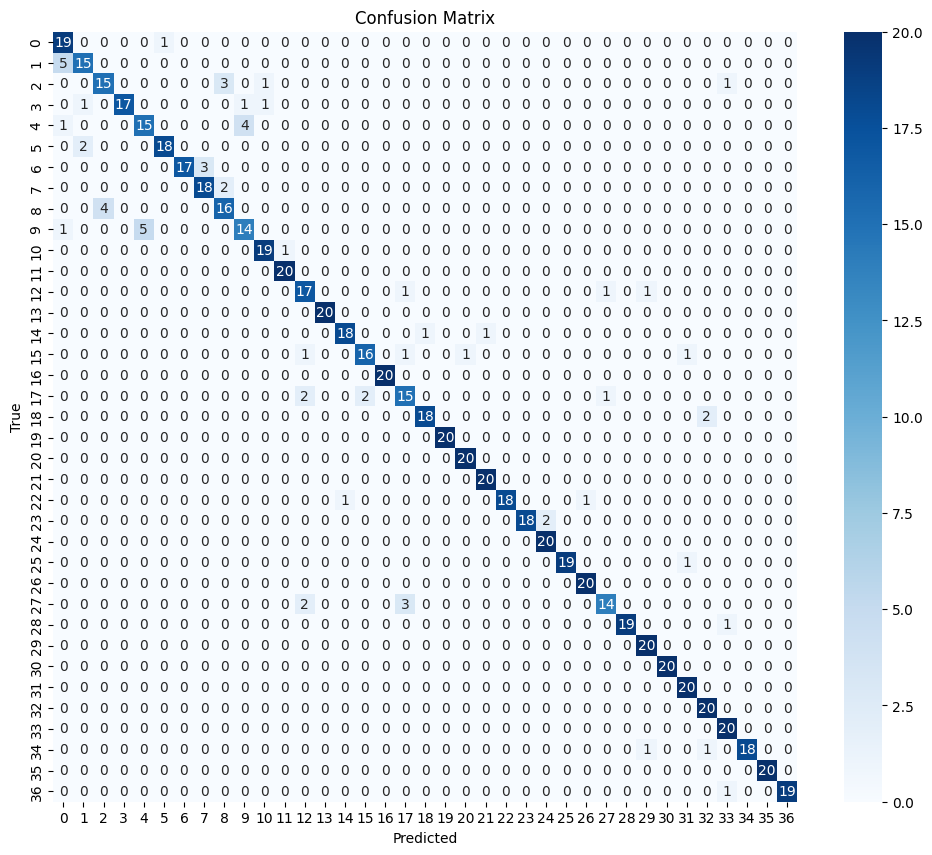

In [46]:
plot_confusion_matrix(vgg19, dataloaders['test'])

## Top k

In [74]:
def evaluate_model_topk(model, phase='test', print_results=True):
    model.eval()

    top1_correct = 0
    top3_correct = 0
    top5_correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in dataloaders[phase]:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)

            _, pred = outputs.topk(5, 1, True, True)
            pred = pred.t()
            correct = pred.eq(labels.view(1, -1).expand_as(pred))

            top1_correct += correct[:1].reshape(-1).float().sum().item()
            top3_correct += correct[:3].reshape(-1).float().sum().item()
            top5_correct += correct[:5].reshape(-1).float().sum().item()
            total += labels.size(0)

    top3_acc = top3_correct / (total)
    top5_acc = top5_correct / (total)

    if print_results:
        print(f'Top-3 Accuracy: {top3_acc:.4f}')
        print(f'Top-5 Accuracy: {top5_acc:.4f}')

In [75]:
evaluate_model_topk(vgg19)

Top-3 Accuracy: 0.9905
Top-5 Accuracy: 1.0000


## Бинарный случай

In [47]:
def evaluate_binary_model(model, loader, criterion, class_edge):
    model.eval()
    loss = 0.0
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss += criterion(outputs, labels).item() * images.size(0)

            _, preds = torch.max(outputs, 1)
            binary_preds = (preds >= class_edge).long()
            binary_labels = (labels >= class_edge).long()

            all_preds.append(binary_preds.cpu().numpy())
            all_labels.append(binary_labels.cpu().numpy())

    all_preds = np.concatenate(all_preds)
    all_labels = np.concatenate(all_labels)

    loss = loss / len(loader.dataset)
    acc = (all_preds == all_labels).mean()
    conf_matrix = confusion_matrix(all_labels, all_preds)

    return loss, acc, conf_matrix

In [49]:
loss_test, acc_test, conf_matrix_test = evaluate_binary_model(vgg19, dataloaders['test'], criterion, CLASS_EDGE)

print(f"LOSS: {loss_test}, ACCURACY: {acc_test}")

LOSS: 0.29087994264814304, ACCURACY: 0.9986468200270636


## Разберёмся с GradCam

#### Тут переиспользуется старый код, чтобы можно было пропускать всё кроме начала (имея обученные веса)

In [3]:
import torch
from torch import nn
from torchvision import models
import torch.optim as optim
from torch.optim import lr_scheduler

device = torch.device("cuda")

def vgg19_model(num_classes):
    model = models.vgg19(pretrained=True)

    for param in model.parameters():
        param.requires_grad = False

    num_features = model.classifier[6].in_features
    model.classifier[6] = nn.Linear(num_features, num_classes)

    model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.classifier[6].parameters(), lr=0.001, momentum=0.9)

    exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    return model, criterion, optimizer, exp_lr_scheduler

vgg19, _, _, _ = vgg19_model(37)

h:\ML\ML_clean\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
h:\ML\ML_clean\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [4]:
vgg19.load_state_dict(torch.load('vgg19_weights.pth'))

<All keys matched successfully>

In [5]:
x = torch.randn(1, 3, 224, 224).to(device)
output = vgg19(x)
print(output.shape)

torch.Size([1, 37])


In [6]:
!pip install grad-cam

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from torchvision import transforms
from PIL import Image

def apply_grad_cam_vgg19(model, image_path, target_layers, target_class=None, use_cuda=True):
    image = Image.open(image_path).convert('RGB')

    preprocess = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    input_tensor = preprocess(image).unsqueeze(0)

    if use_cuda and torch.cuda.is_available():
        model = model.to(device)
        input_tensor = input_tensor.to(device)

    cam = GradCAM(model=model, target_layers=target_layers)

    if target_class is None:
        model.eval()
        with torch.no_grad():
            output = model(input_tensor)
            pred_class = torch.argmax(output).item()
        target_class = pred_class
    print("cam creation START")
    grayscale_cam = cam(input_tensor=input_tensor, targets=[ClassifierOutputTarget(target_class)])
    print("cam creation DONE")
    rgb_img = np.array(image.resize((224, 224))) / 255.0
    visualization = show_cam_on_image(rgb_img, grayscale_cam[0], use_rgb=True)

    _, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(rgb_img)
    ax[0].set_title('Original Image')
    ax[0].axis('off')

    ax[1].imshow(visualization)
    ax[1].set_title(f'Grad-CAM')
    ax[1].axis('off')

    plt.tight_layout()
    plt.show()

In [16]:
import os

target_layers = [vgg19.features[34]]

image_files = [os.path.join(dataset_path, f) for f in os.listdir(dataset_path) if f.lower().endswith('.jpg')]

test_image_path = image_files[0]

In [20]:
apply_grad_cam_vgg19(
    model=vgg19,
    image_path=test_image_path,
    target_layers=target_layers
)

cam creation START


AttributeError: 'NoneType' object has no attribute 'shape'